In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import random
import datetime
import os
import time
import glob
import pandas as pd
import xarray as xr
from dateutil.relativedelta import relativedelta

import argparse

from utils import normalize, int_to_datetime

from mpnnlstm import NextFramePredictorS2S
from seq2seq import Seq2Seq

from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler

from ice_test import IceDataset

from graph_functions import create_static_heterogeneous_graph

In [32]:
device = torch.device('cpu')

# Defaults
convolution_type = 'TransformerConv'
lr = 0.001
multires_training = False
truncated_backprop = 0

training_years = range(2008, 2014)
x_vars = ['siconc', 't2m', 'v10', 'u10', 'sshf']
y_vars = ['siconc']  # ['siconc', 't2m']
input_features = len(x_vars)
input_timesteps = 10
output_timesteps= 90

binary=False

# Set threshold 
thresh = -np.inf
print(f'Threshold is {thresh}')

# Note: irrelevant if thresh = -np.inf
def dist_from_05(arr):
    return abs(abs(arr - 0.5) - 0.5)

# Arguments passed to Seq2Seq constructor
model_kwargs = dict(
    hidden_size=32,
    dropout=0.1,
    n_layers=1,
    transform_func=dist_from_05,
    dummy=False,
    n_conv_layers=3,
    rnn_type='LSTM',
    convolution_type=convolution_type,
)

month = 4
ds = xr.open_mfdataset(glob.glob('data/hb_era5_glorys_nc/*.nc'))
mask = np.isnan(ds.siconc.isel(time=0)).values

graph_structure = create_static_heterogeneous_graph(mask.shape, 4, mask, use_edge_attrs=True, resolution=1/12, device=device)

data_val = IceDataset(ds, [2015], month, input_timesteps, output_timesteps, x_vars, y_vars)

experiment_name = f'M{str(month)}_Y{training_years[0]}_Y{training_years[-1]}_I{input_timesteps}O{output_timesteps}'

model = NextFramePredictorS2S(
    thresh=thresh,
    experiment_name=experiment_name,
    input_features=input_features,
    input_timesteps=input_timesteps,
    output_timesteps=output_timesteps,
    transform_func=dist_from_05,
    device=device,
    binary=binary,
    debug=False, 
    model_kwargs=model_kwargs)

results_dir = f'ice_results_may23b_9'

model.load(results_dir)

Threshold is -inf


In [46]:
ds

<xarray.Dataset>
Dimensions:    (time: 2930, latitude: 229, longitude: 361)
Coordinates:
  * time       (time) datetime64[ns] 2010-01-01 2010-01-02 ... 2018-01-01
  * longitude  (longitude) float32 -95.0 -94.92 -94.83 ... -65.17 -65.08 -65.0
    area       (latitude, longitude) float32 dask.array<chunksize=(229, 361), meta=np.ndarray>
    distx      (latitude, longitude) float32 dask.array<chunksize=(229, 361), meta=np.ndarray>
    disty      (latitude, longitude) float32 dask.array<chunksize=(229, 361), meta=np.ndarray>
  * latitude   (latitude) float32 51.0 51.08 51.17 51.25 ... 69.83 69.92 70.0
    depth      float32 0.494
Data variables:
    siconc     (time, latitude, longitude) float32 dask.array<chunksize=(366, 229, 361), meta=np.ndarray>
    t2m        (time, latitude, longitude) float32 dask.array<chunksize=(366, 229, 361), meta=np.ndarray>
    v10        (time, latitude, longitude) float32 dask.array<chunksize=(366, 229, 361), meta=np.ndarray>
    u10        (time, latitude, longitude) float32 dask.array<chunksize=(366, 229, 361), meta=np.ndarray>
    sshf       (time, latitude, longitude) float32 dask.array<chunksize=(366, 229, 361), meta=np.ndarray>
Attributes: (12/24)
    Conventions:        CF-1.4
    bulletin_date:      2020-06-03 00:00:00
    bulletin_type:      operational
    comment:            CMEMS product
    domain_name:        GL12
    easting:            longitude
    ...                 ...
    northing:           latitude
    references:         http://www.mercator-ocean.fr
    source:             MERCATOR GLORYS12V1
    title:              daily mean fields from Global Ocean Physics Analysis ...
    z_max:              5727.917
    z_min:              0.494025

In [49]:
climatology = ds[y_vars].fillna(0).groupby('time.dayofyear').mean('time', skipna=True).to_array().values
climatology = torch.tensor(np.nan_to_num(climatology)).to(device)

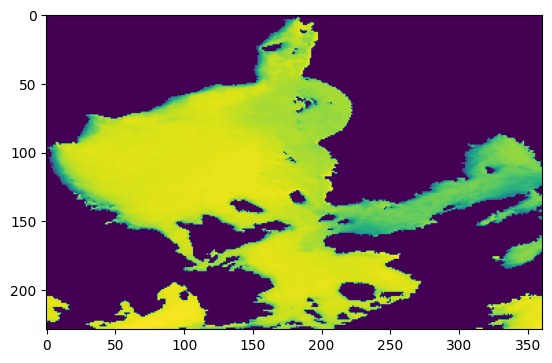

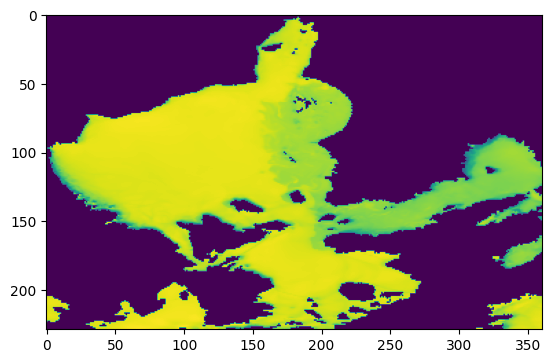

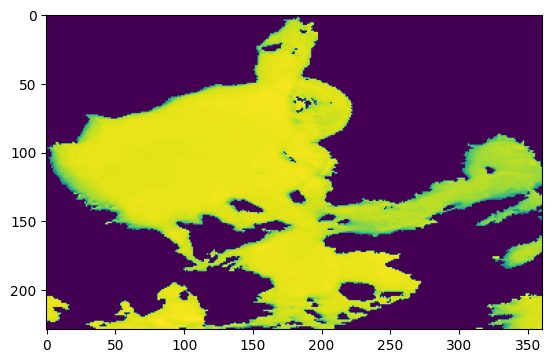

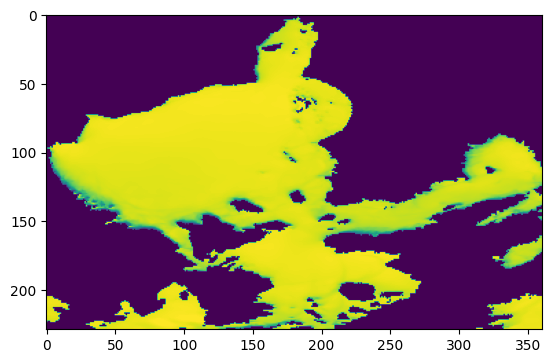

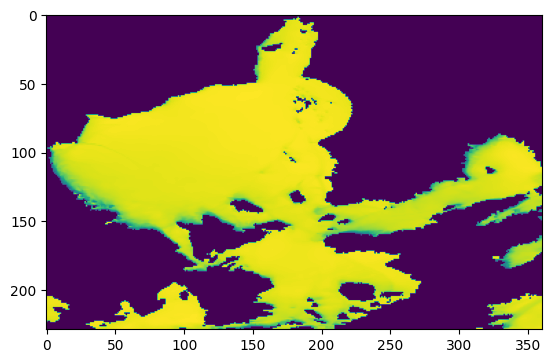

...

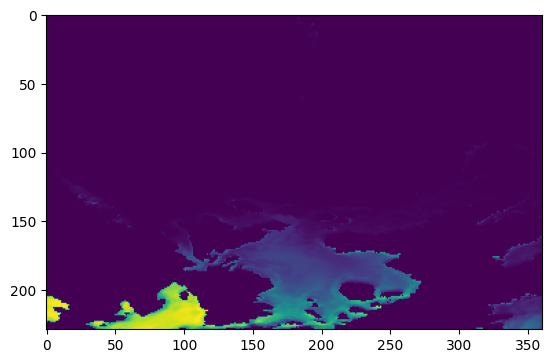

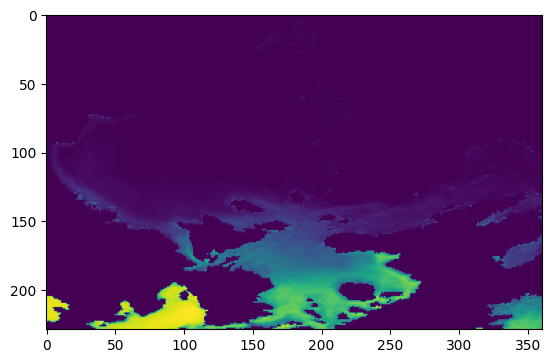

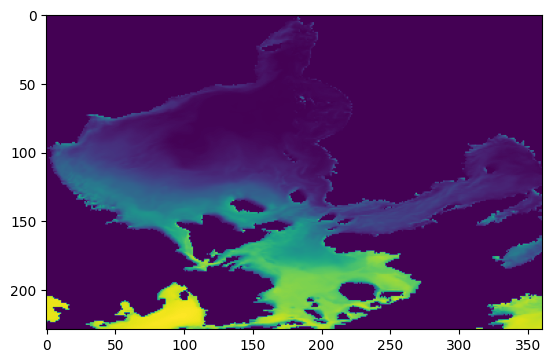

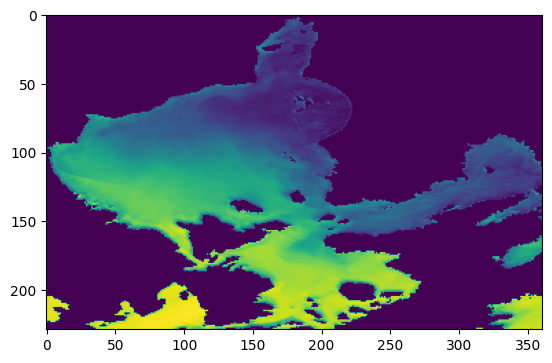

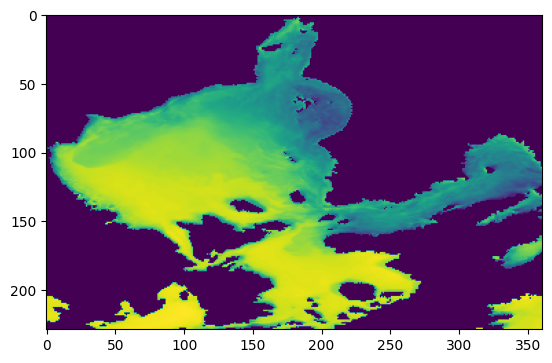

In [50]:
for i in np.arange(0, 360, 10):
    plt.imshow(climatology[0][i])
    plt.show()

2015-04-16


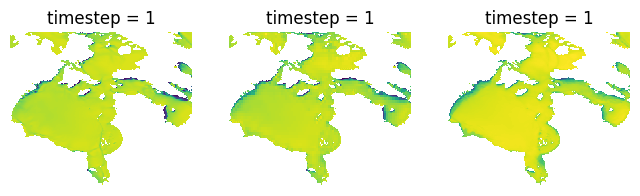

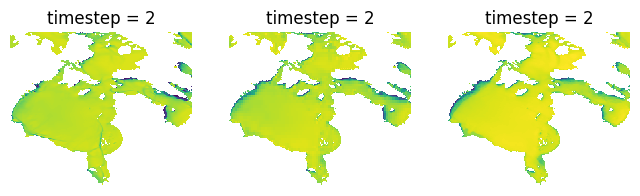

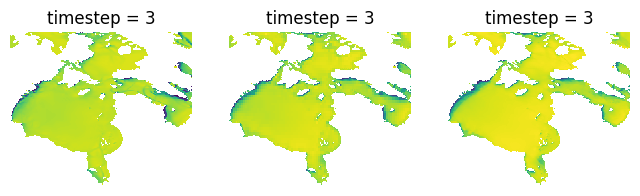

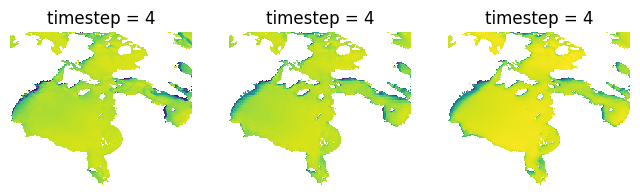

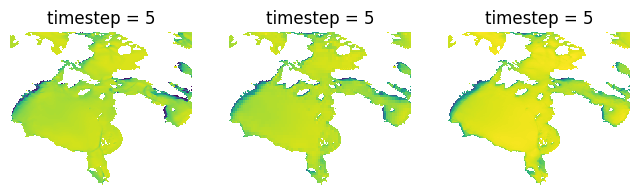

...

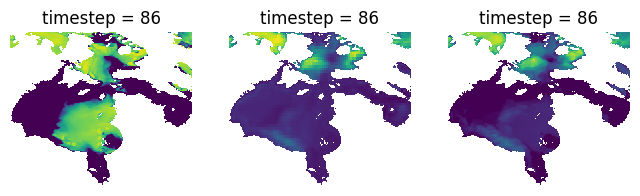

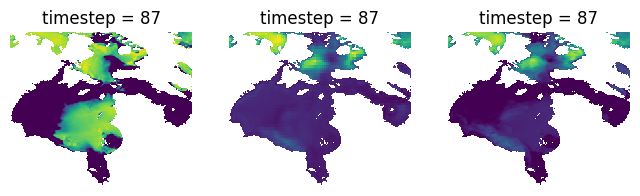

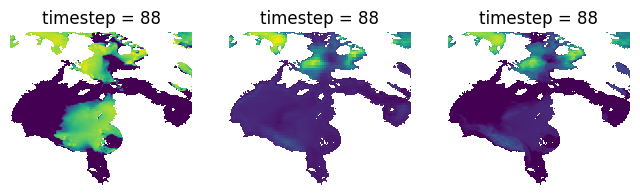

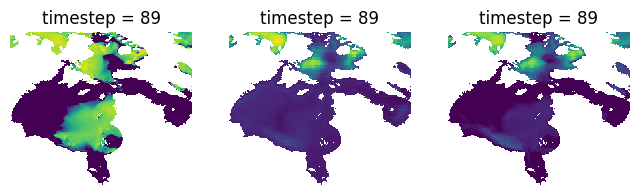

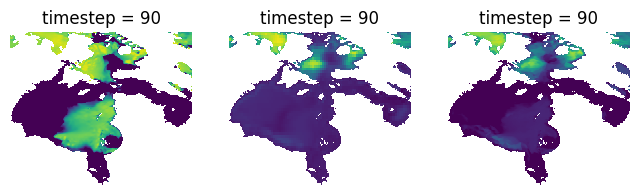

In [52]:
# Generate predictions
timestep = 15
launch_date = int_to_datetime(int(next(loader_val.__iter__())[-1]))
launch_doy = launch_date.timetuple().tm_yday
loader_val = DataLoader(data_val, batch_size=1, shuffle=False, sampler=SubsetRandomSampler([timestep]))#, collate_fn=lambda x: x)
model.model.eval()
val_preds = model.predict(loader_val, climatology, mask=mask, graph_structure=graph_structure)

# Save results
ds_pred = xr.Dataset(
    data_vars=dict(
        y_hat=(["timestep", "latitude", "longitude"], val_preds.squeeze(-1).squeeze(0)),
        y_true=(["timestep", "latitude", "longitude"], loader_val.dataset.y[[timestep]].squeeze(-1).squeeze(0)),
        climatology=(["timestep", "latitude", "longitude"], climatology[0, launch_doy:launch_doy+90]),
    ),
    coords=dict(
        longitude=ds.longitude,
        latitude=ds.latitude,
        timestep=np.arange(1, output_timesteps+1),
    ),
)

print(str(launch_date)[:10])
for ts in ds_pred.timestep:
    fig, axs = plt.subplots(1, 3, figsize=(8, 2))
    ds_pred.sel(timestep=ts).y_true.where(~mask).plot(ax=axs[0], vmin=0, vmax=1, add_colorbar=False)
    ds_pred.sel(timestep=ts).y_hat.where(~mask).plot(ax=axs[1], vmin=0, vmax=1, add_colorbar=False)
    ds_pred.sel(timestep=ts).climatology.where(~mask).plot(ax=axs[2], vmin=0, vmax=1, add_colorbar=False)
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()